# OOI data cleaning
Loading OOI Coastal Endurance data from ERDDAP, looking qualitatively at data, and filtering erroneous data entries. Working with John Wilkin (Rutgers) and in collaboration with Chris Edwards and Luke Hamilton (UCSC) to look at ocean optics using the Surface Piercing Profiler. John and I are interested in downwelling spectral irradiance.

##### author: Turner E Johnson
##### date: 2023-03-25


In [2]:
import numpy as np
import pandas as pd 
import datetime as dt
from matplotlib import pyplot as plt 
import seaborn as sns
import urllib.request

import erddapClient as erd

Lists for iteration in later *for* loops. Colors palette associated with 7 wavelengths that the spectral irradiance instrument records. Conversion between wavelength and hex color code from academo.org (https://academo.org/demos/wavelength-to-colour-relationship/). 

- *wavelengthnm_list* is most useful as these are the column titles I use for a pandas dataframe of OOI data.
- *wavelengthqc_agg_list* is an OOI-generated column showing aggregate QC tests. These are largely *NaN* values.
- *mooring_list* is a list containing the four Coastal Endurance surface piercing profiler sites: Oregon Inshore, Oregon Shelf, Washington Inshore, and Washington Shelf. All code that does math on these sites does it in the same order, referencing the same indices where 0=or_inshore, 1=or_shelf, 2=wa_inshore, and 3=wa_shelf.
- *data_id_list* is a list of OOI IDs associated with the four sites above.
- *maxdepths* are each site's max depth, used for data cutoff in cleaning process. Values determined by qualitative examination of depth/spectir curves.

In [14]:
#initializing palettes and iteration lists
colors = ["#7b00e2", "#001bff", "#00ffff", "#00ff00", "#b3ff00", "#ff7700", "#ff0000"]
pal = sns.color_palette(colors)

wavelengthnm_list = ["spectir_412nm","spectir_443nm","spectir_490nm","spectir_510nm","spectir_555nm","spectir_620nm","spectir_683nm"]
wavelengthqc_agg_list = ["spectir_412nm_qc_agg","spectir_443nm_qc_agg","spectir_490nm_qc_agg","spectir_510nm_qc_agg","spectir_555nm_qc_agg","spectir_620nm_qc_agg","spectir_683nm_qc_agg"]
mooring_list = ["or_inshore", "or_shelf","wa_inshore","wa_shelf"]
data_id_list = ["ooi-ce01issp-sp001-07-spkirj000", "ooi-ce02shsp-sp001-06-spkirj000", 
                "ooi-ce06issp-sp001-07-spkirj000", "ooi-ce07shsp-sp001-06-spkirj000"]
maxdepths = [-18.,-69.,-24.,-74.] 

Loading in data for all four sites, saving directly to a list of pandas dataframes (*mooring_dfs*). Making four queries to the ERDDAP data explorer via erddapClient package.

A little extra massaging eliminating units from column titles (they contain a space before the unit) and changing "time" column from string format to numpy's datetime64.

In [4]:
mooring_dfs = []
for i in range(0,4):
    remote_td = erd.ERDDAP_Tabledap('http://erddap.dataexplorer.oceanobservatories.org/erddap',data_id_list[i])
    df = (remote_td.setResultVariables(['time','z',
                                        'spectir_412nm','spectir_412nm_qc_agg',
                                        'spectir_443nm','spectir_443nm_qc_agg',
                                        'spectir_490nm','spectir_490nm_qc_agg', 
                                        'spectir_510nm','spectir_510nm_qc_agg', 
                                        'spectir_555nm','spectir_555nm_qc_agg',
                                        'spectir_620nm','spectir_620nm_qc_agg',
                                        'spectir_683nm','spectir_683nm_qc_agg']).getDataFrame()
                    )
    df.columns = df.columns.str.split(' ').str[0]
    df['time'] = df['time'].to_numpy(dtype='datetime64')
    mooring_dfs.append(df)

Taking a quick glance at the raw oregon inshore data:

In [5]:
mooring_dfs[0]

,time,z,spectir_412nm,spectir_412nm_qc_agg,spectir_443nm,spectir_443nm_qc_agg,spectir_490nm,spectir_490nm_qc_agg,spectir_510nm,spectir_510nm_qc_agg,spectir_555nm,spectir_555nm_qc_agg,spectir_620nm,spectir_620nm_qc_agg,spectir_683nm,spectir_683nm_qc_agg
0,2014-04-17 22:28:00,-20.0,0.030614,NaN,0.023073,NaN,0.139625,NaN,0.220813,NaN,0.442157,NaN,-0.002197,NaN,0.005706,NaN
1,2014-04-17 22:28:00,-19.0,0.037231,NaN,0.030066,NaN,0.171555,NaN,0.269376,NaN,0.528362,NaN,-0.000152,NaN,0.006310,NaN
2,2014-04-17 22:28:00,-18.0,0.048694,NaN,0.042189,NaN,0.218303,NaN,0.344181,NaN,0.669369,NaN,0.004723,NaN,0.007052,NaN
3,2014-04-17 22:28:00,-17.0,0.057129,NaN,0.050411,NaN,0.250974,NaN,0.395703,NaN,0.766718,NaN,0.007724,NaN,0.007074,NaN
4,2014-04-17 22:28:00,-16.0,0.065813,NaN,0.059395,NaN,0.283560,NaN,0.446932,NaN,0.865479,NaN,0.013464,NaN,0.007337,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49938,2022-09-27 07:53:00,-5.0,0.010989,NaN,-0.002785,NaN,0.010997,NaN,0.007728,NaN,-0.006375,NaN,-0.005846,NaN,0.008078,NaN
49939,2022-09-27 07:53:00,-4.0,0.010630,NaN,-0.002738,NaN,0.010916,NaN,0.007805,NaN,-0.006242,NaN,-0.005502,NaN,0.007749,NaN
49940,2022-09-27 07:53:00,-3.0,0.010466,NaN,-0.002522,NaN,0.010447,NaN,0.007654,NaN,-0.007148,NaN,-0.005562,NaN,0.007265,NaN
49941,2022-09-27 07:53:00,-2.0,0.010201,NaN,-0.002446,NaN,0.010259,NaN,0.007780,NaN,-0.006556,NaN,-0.005270,NaN,0.006446,NaN


Now filtering everything at once: using triple nested *for* loop. 

* *i* indexes through the four sites: or_inshore, or_shelf, wa_inshore, and wa_shelf. Each of the sites has a max depth.
* *j* indexes through 7 wavelengths: 412nm, 443nm, 490nm, 510nm, 555nm, 620nm, and 683nm. A spectral irradiance row (with a column of any wavelength) will be removed if the spectir value is below 0 or if the associated QC column contains "4.0" which corresponds to a failure of the OOI QC test, per metadata information for all 4 profilers (e.g. "variable:	spectir_412nm_qc_agg" from https://erddap.dataexplorer.oceanobservatories.org/erddap/info/ooi-ce01issp-sp001-07-spkirj000/index.html). Spectral irradiance cannot be below 0, as these instruments count photons.
* *k* indexes through as many integer depths as there are between 0 (surface) and maxdepth associated with site. At this deepest loop, the 95% region for spectral irradiance is calculated for a specific depth, for a specific wavelength, and for a specific site. Mechanism for keeping good values is to add the good rows to an empty dataframe as the *k* loop cycles through depths. Filtered dataframe is then re-sorted by time and re-indexed.

The 

In [25]:
filtered_mooring_dfs = []
diff_dfs = []

for i in range(0,4): # four sites and 4 dfs
    df = mooring_dfs[i]
    site_maxdepth = maxdepths[i]
    
    for j in range(0,7): #seven wavelngths in each site df
        wavelength = wavelengthnm_list[j]
        #d print(j,wavelength, len(df)) #
        df = df.drop(df[df[wavelength] < -0.].index)
        #d print(len(df),"after removing below 0s")
        df = df.drop(df[df[wavelengthqc_agg_list[j]] == 4.].index)
        #d print(len(df),"after removing fail=4s")
        
        #initializing empty df for the new z-chunked dataframe
        depthchunked_df = pd.DataFrame(columns=df.columns).reindex(index=[])
        for k in range(0,int(site_maxdepth-1),-1): #0,-1,-2,...,-25
            # calculate the mean and standard deviation of each wavelength column j
            #isolating rows at the iterated depth into a new dataframe
            z_df = df.loc[df['z'] == k]
            #taking the mean and std of spectral irradiance for the specific wavelength col (one loop up)
            z_mean = z_df[wavelength].mean()
            z_std = z_df[wavelength].std()
            #observe 2 and 3 sigma ranges
            sigma2 = z_mean + 2*z_std
            sigma3 = z_mean + 3*z_std
            # filter the rows that have values below the upper limit for the specified column
            filtrd_z_df = z_df.loc[(z_df[wavelength] <= sigma3)]
            # return the good data, for a specifc z, to an initialized dataframe
            depthchunked_df=depthchunked_df.append(filtrd_z_df)        

    #result of filtered dataframe for entire site
    df_filtered = depthchunked_df.sort_values(by='time')
    #creating a "differences" df for each site, adding to diffs_dfs list
    merged_df = pd.merge(mooring_dfs[i], df_filtered, how='outer', indicator=True)
    diff_df = merged_df.loc[merged_df['_merge'] == 'left_only', mooring_dfs[i].columns]
    diff_dfs.append(diff_df)
    
    df_filtered = df_filtered.reset_index(drop=True) #resetting index
    df_filtered.drop(columns=wavelengthqc_agg_list, inplace=True) #drop qc cols
    filtered_mooring_dfs.append(df_filtered)

Now pulling out individual dataframe from lists, so that we can do big-picture comparison by looking at the changes in lengths of the dataframes.

In [7]:
or_inshore = mooring_dfs[0]
or_inshore_filtered = filtered_mooring_dfs[0]
or_inshore_diff = diff_dfs[0]

or_shelf = mooring_dfs[1]
or_shelf_filtered = filtered_mooring_dfs[1]
or_shelf_diff = diff_dfs[1]

wa_inshore = mooring_dfs[2]
wa_inshore_filtered = filtered_mooring_dfs[2]
wa_inshore_diff = diff_dfs[2]

wa_shelf = mooring_dfs[3]
wa_shelf_filtered = filtered_mooring_dfs[3]
wa_shelf_diff = diff_dfs[3]

In [8]:
or_inshore_filtered

,time,z,spectir_412nm,spectir_443nm,spectir_490nm,spectir_510nm,spectir_555nm,spectir_620nm,spectir_683nm
0,2014-04-17 22:28:00,-18.0,0.048694,0.042189,0.218303,0.344181,0.669369,0.004723,0.007052
1,2014-04-17 22:28:00,-17.0,0.057129,0.050411,0.250974,0.395703,0.766718,0.007724,0.007074
2,2014-04-17 22:28:00,-16.0,0.065813,0.059395,0.283560,0.446932,0.865479,0.013464,0.007337
3,2014-04-17 22:29:00,-12.0,0.240562,0.233234,0.796538,1.171158,2.028231,0.123942,0.019281
4,2014-04-17 22:29:00,-16.0,0.082575,0.076288,0.342218,0.534411,1.012869,0.022377,0.007749
...,...,...,...,...,...,...,...,...,...
24985,2022-09-24 19:50:00,-1.0,0.131434,0.164636,0.306841,1.324342,2.779291,10.474544,1.900192
24986,2022-09-24 19:50:00,-5.0,0.026121,0.026678,0.089246,0.408122,1.112562,1.731183,0.135638
24987,2022-09-24 19:50:00,-3.0,0.057027,0.073567,0.151391,0.737895,1.865766,4.482135,0.523181
24988,2022-09-24 19:50:00,-4.0,0.038530,0.045739,0.114363,0.551325,1.426770,2.738824,0.255545


In [24]:
#filter mech is doing something if these are not zero
print("or inshore nrow diff is: ",len(or_inshore),"-",len(or_inshore_filtered),"=",(len(or_inshore)-len(or_inshore_filtered)))
print("or shelf nrow diff is: ",len(or_shelf),"-",len(or_shelf_filtered),"=",(len(or_shelf)-len(or_shelf_filtered)))
print("wa inshore nrow diff is: ",len(wa_inshore),"-",len(wa_inshore_filtered),"=",(len(wa_inshore)-len(wa_inshore_filtered)))
print("wa shelf nrow diff is: ",len(wa_shelf),"-",len(wa_shelf_filtered),"=",(len(wa_shelf)-len(wa_shelf_filtered)))

or inshore nrow diff is:  49943 - 24990 = 24953
or shelf nrow diff is:  100388 - 25120 = 75268
wa inshore nrow diff is:  40156 - 16800 = 23356
wa shelf nrow diff is:  54997 - 9235 = 45762


Now let's take a look at what we eliminated and what we kept.

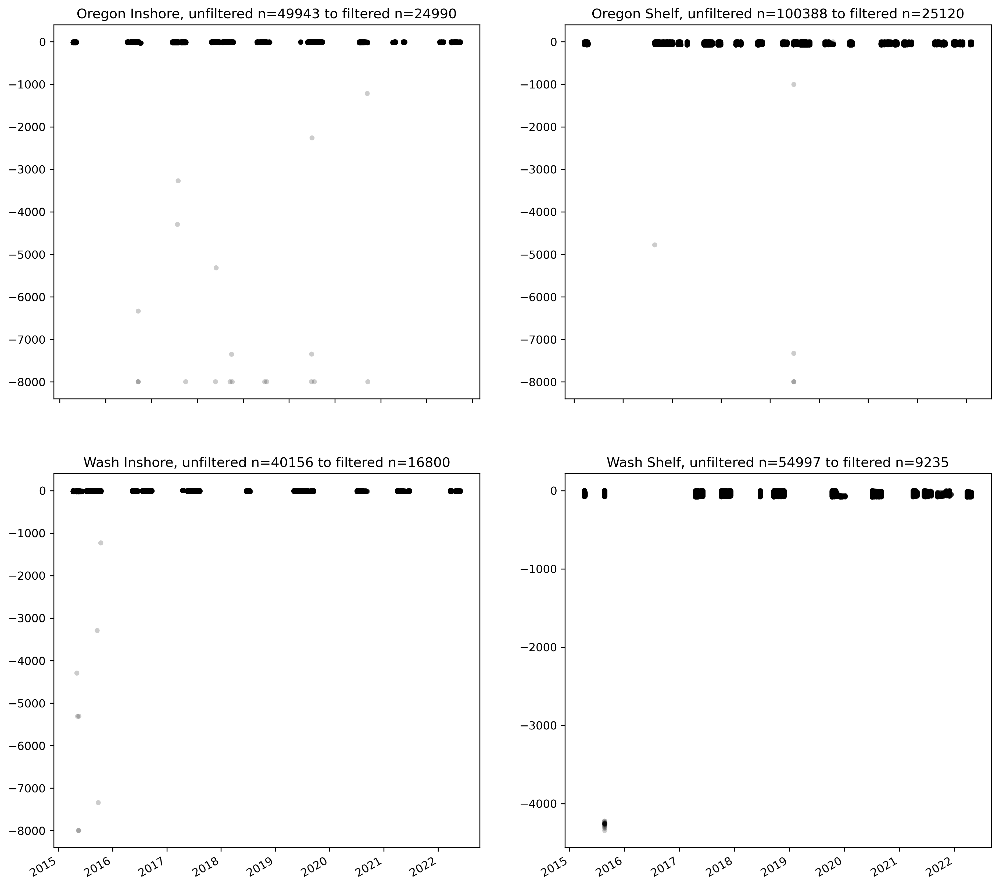

In [10]:
#filtering is doing something if you can see any red not covered by black
fig, ax = plt.subplots(2,2,figsize=(15, 15),dpi=300)
ax[0,0].scatter(or_inshore_diff["time"], or_inshore_diff["z"], color = "k",s=20, alpha = .2, edgecolors='none')
ax[0,0].set_title("Oregon Inshore, unfiltered n={0} to filtered n={1}".format(len(or_inshore),len(or_inshore_filtered)))

ax[0,1].scatter(or_shelf_diff["time"], or_shelf_diff["z"], color = "k",s=20, alpha = .2, edgecolors='none')
ax[0,1].set_title("Oregon Shelf, unfiltered n={0} to filtered n={1}".format(len(or_shelf),len(or_shelf_filtered)))

ax[1,0].scatter(wa_inshore_diff["time"], wa_inshore_diff["z"], color = "k",s=20, alpha = .2, edgecolors='none')
ax[1,0].set_title("Wash Inshore, unfiltered n={0} to filtered n={1}".format(len(wa_inshore),len(wa_inshore_filtered)))

ax[1,1].scatter(wa_shelf_diff["time"], wa_shelf_diff["z"], color = "k",s=20, alpha = .2, edgecolors='none')
ax[1,1].set_title("Wash Shelf, unfiltered n={0} to filtered n={1}".format(len(wa_shelf),len(wa_shelf_filtered)))

fig.autofmt_xdate()
plt.show()

Or zooming in:

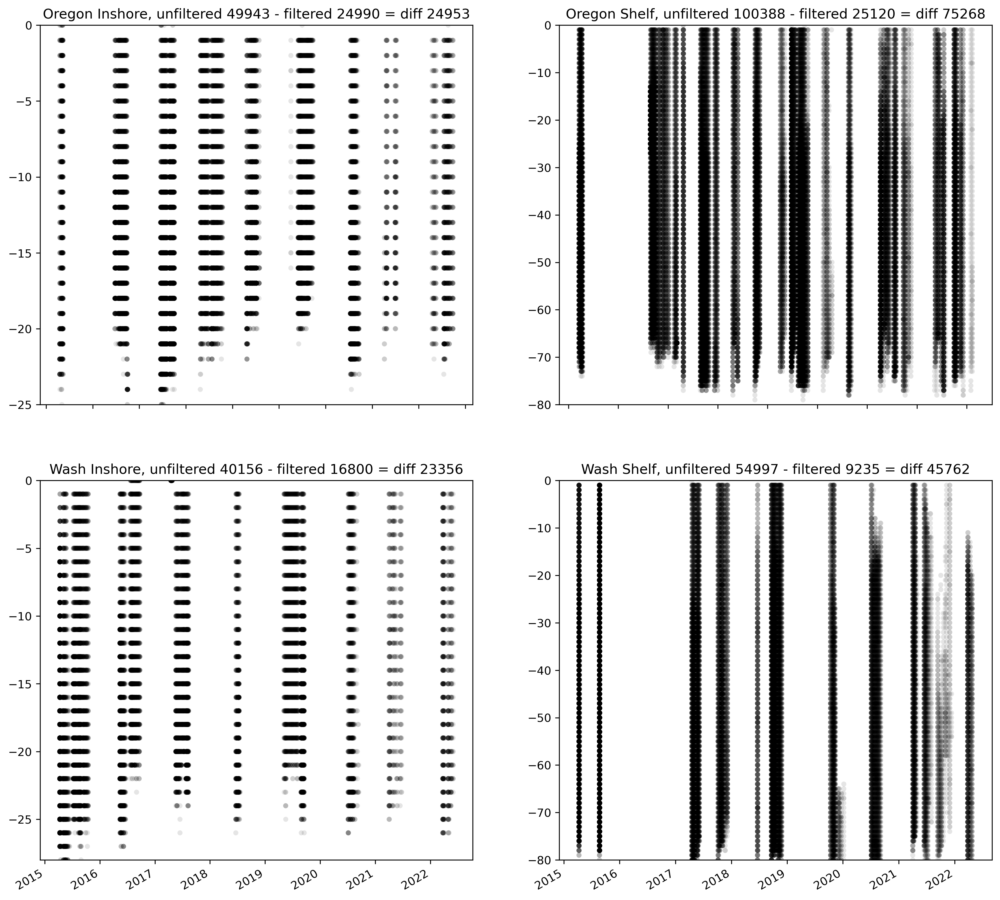

In [11]:
# dots and alpha??
#filtering is doing something if you can see any red not covered by black
#change range to 
fig, ax = plt.subplots(2,2,figsize=(15, 15),dpi=300)
ax[0,0].scatter(or_inshore_diff["time"], or_inshore_diff["z"], color = "k",s=20, alpha = .1, edgecolors='none')
ax[0,0].set_title("Oregon Inshore, unfiltered {0} - filtered {1} = diff {2}".format(len(or_inshore),len(or_inshore_filtered),len(or_inshore_diff)))
ax[0,0].set_ylim([-25, 0])

ax[0,1].scatter(or_shelf_diff["time"], or_shelf_diff["z"], color = "k",s=20, alpha = .1, edgecolors='none')
ax[0,1].set_title("Oregon Shelf, unfiltered {0} - filtered {1} = diff {2}".format(len(or_shelf),len(or_shelf_filtered),len(or_shelf_diff)))
ax[0,1].set_ylim([-80, 0])

ax[1,0].scatter(wa_inshore_diff["time"], wa_inshore_diff["z"], color = "k",s=20, alpha = .1, edgecolors='none')
ax[1,0].set_title("Wash Inshore, unfiltered {0} - filtered {1} = diff {2}".format(len(wa_inshore),len(wa_inshore_filtered),len(wa_inshore_diff)))
ax[1,0].set_ylim([-28, 0])

ax[1,1].scatter(wa_shelf_diff["time"], wa_shelf_diff["z"], color = "k",s=20, alpha = .1, edgecolors='none')
ax[1,1].set_title("Wash Shelf, unfiltered {0} - filtered {1} = diff {2}".format(len(wa_shelf),len(wa_shelf_filtered),len(wa_shelf_diff)))
ax[1,1].set_ylim([-80, 0])
fig.autofmt_xdate()
plt.show()

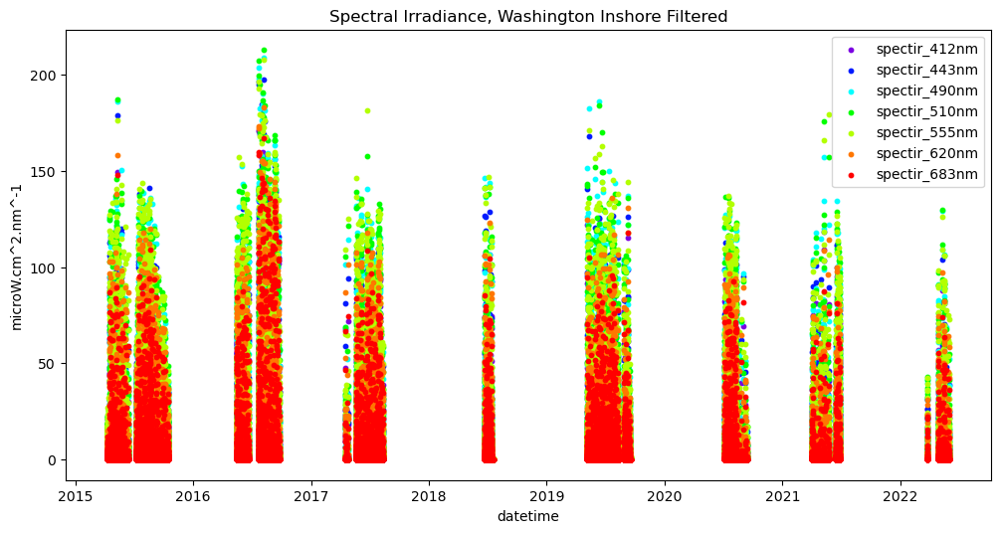

In [98]:
plt.figure(figsize=(12,6), dpi=100)
for i in range(0,7):
    plt.scatter(wa_inshore_filtered["time"], wa_inshore_filtered[wavelengthnm_list[i]], 
             label = wavelengthnm_list[i], color = pal[i],s=10)
plt.title('Spectral Irradiance, Washington Inshore Filtered')
plt.xlabel("datetime")
plt.ylabel("microW.cm^2.nm^-1")
plt.legend(facecolor="white")

Now plotting the remaining filtered spectral irradiance by datetime, separated by color:

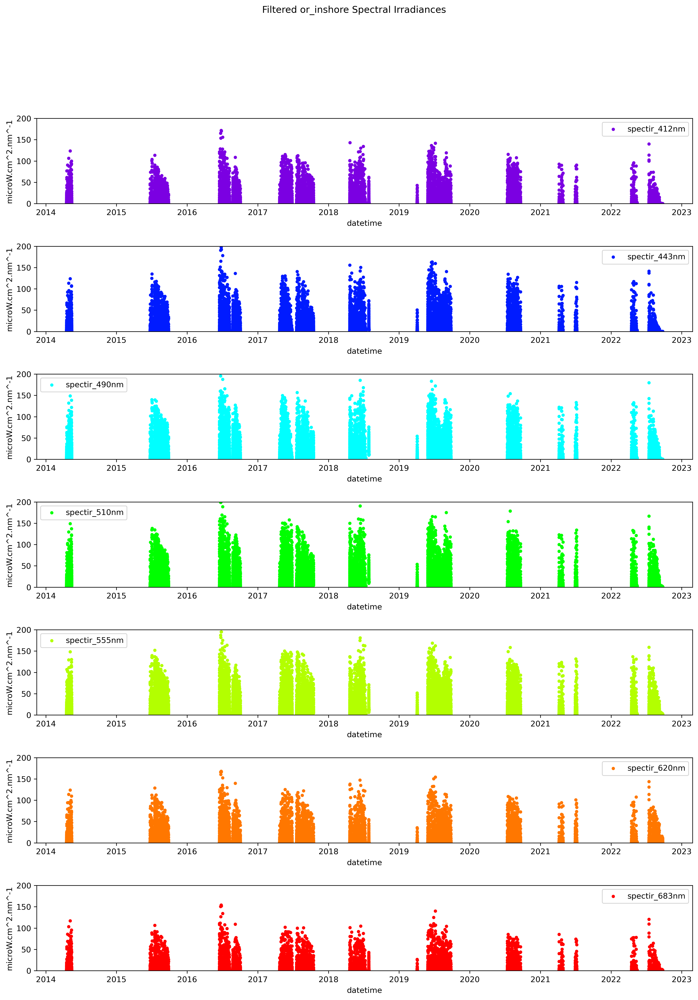

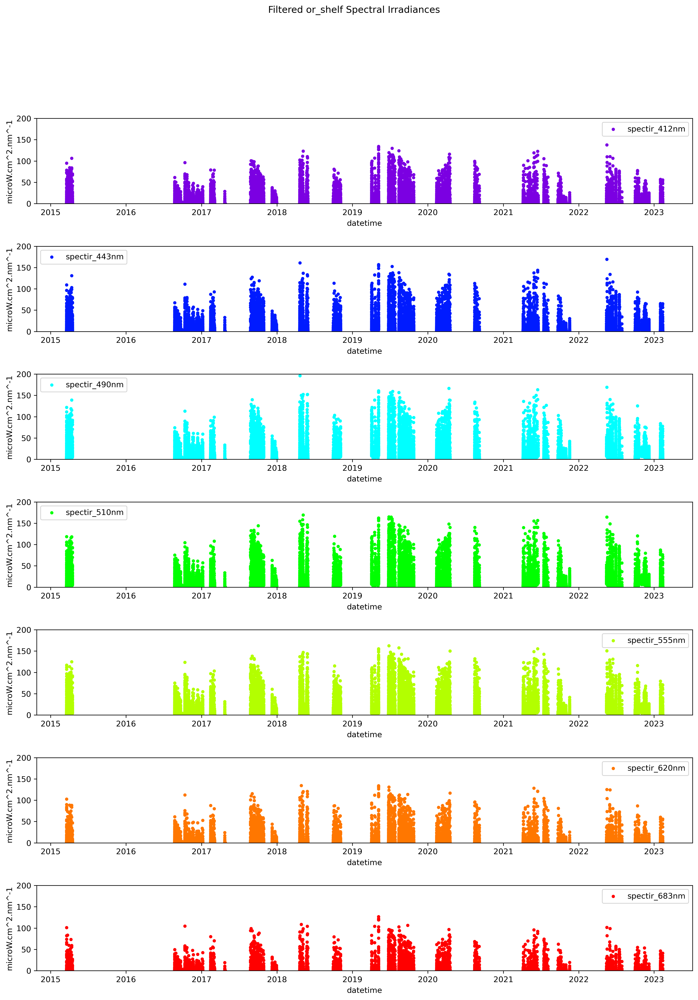

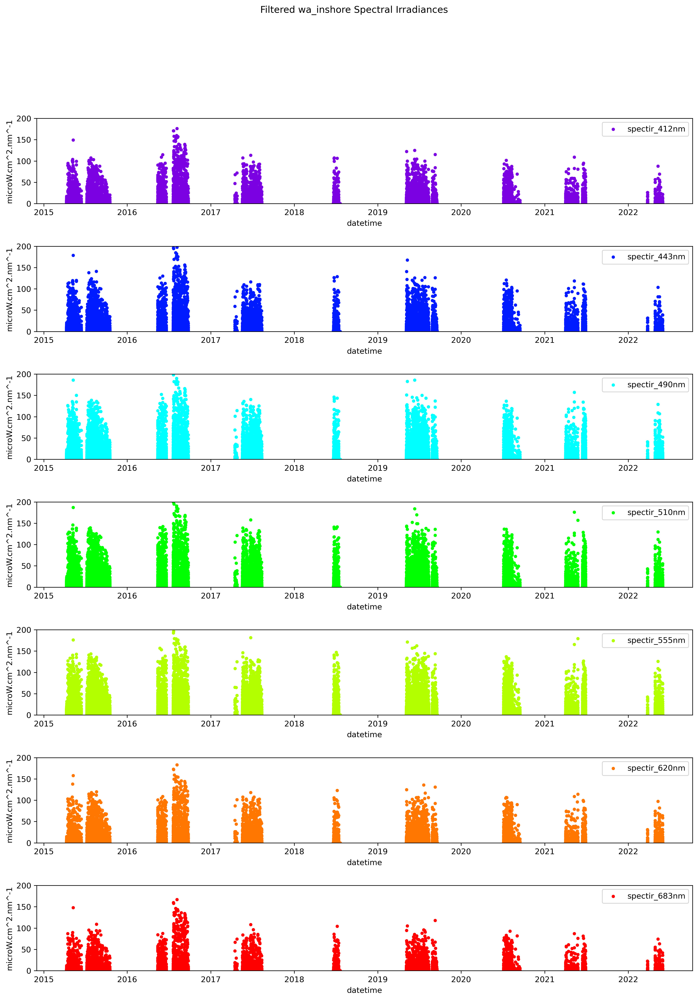

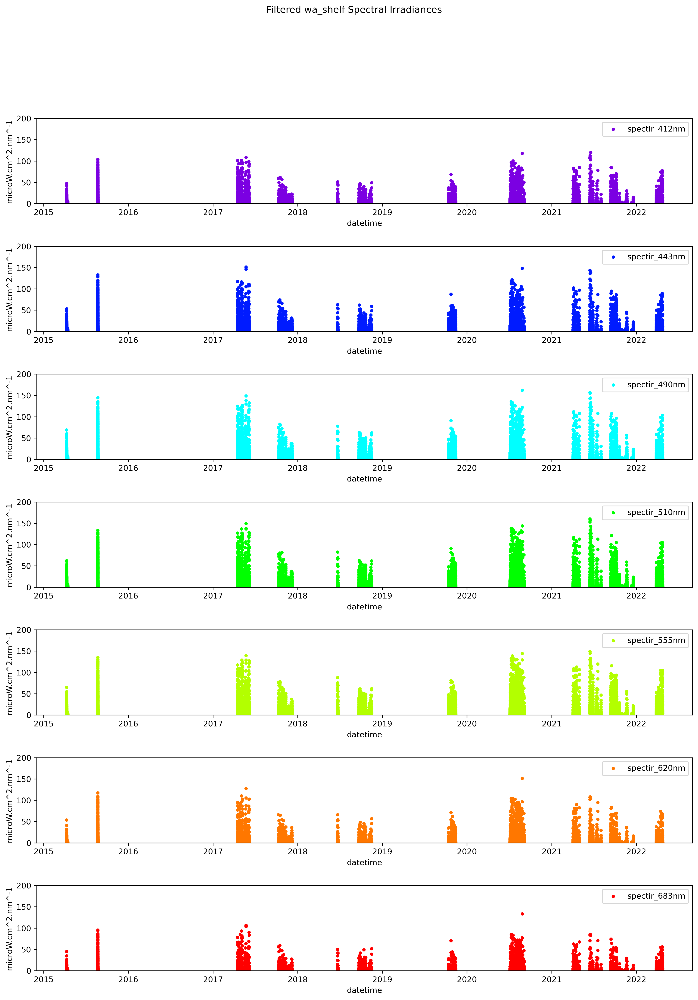

In [12]:
for site in range(4):
    fig, axs = plt.subplots(7,1, figsize=(15, 20), facecolor='w', edgecolor='k', dpi=300)
    fig.subplots_adjust(hspace = .5, wspace=.001)
    fig.suptitle("Filtered {} Spectral Irradiances".format(mooring_list[site]))
    axs = axs.ravel()
    for i in range(7):
        axs[i].scatter(filtered_mooring_dfs[site]["time"], filtered_mooring_dfs[site][wavelengthnm_list[i]], 
                 label = wavelengthnm_list[i], color = pal[i],s=10)
        axs[i].set_xlabel("datetime")
        axs[i].set_ylabel("microW.cm^2.nm^-1")
        axs[i].legend()
        axs[i].set_ylim([0, 200])

And here are the data points that have been deleted, or the "difference" points between the original and filtered data sets.

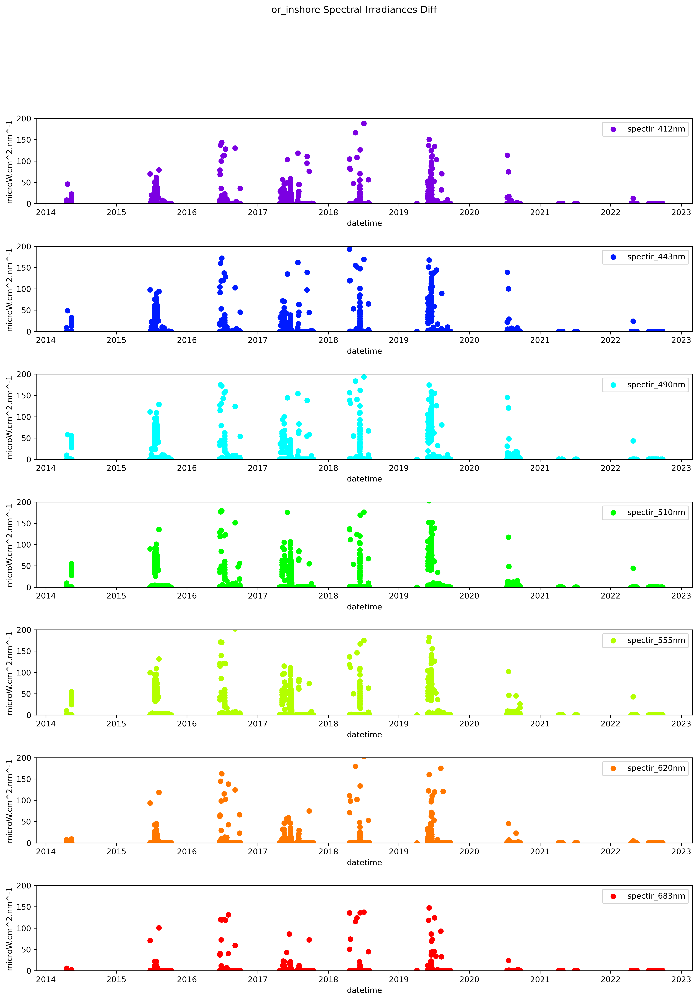

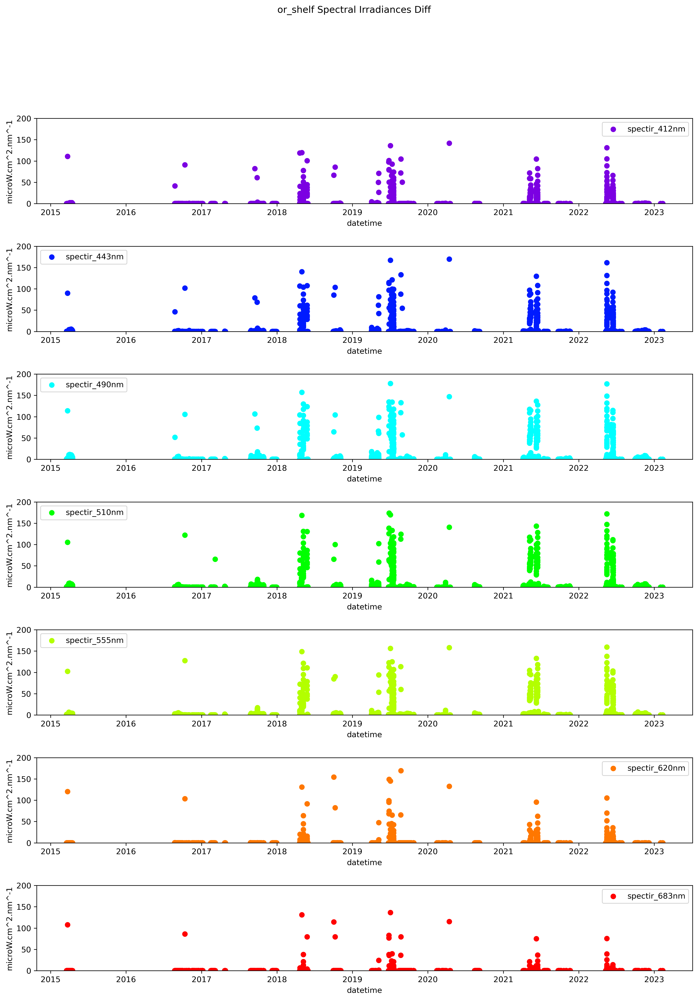

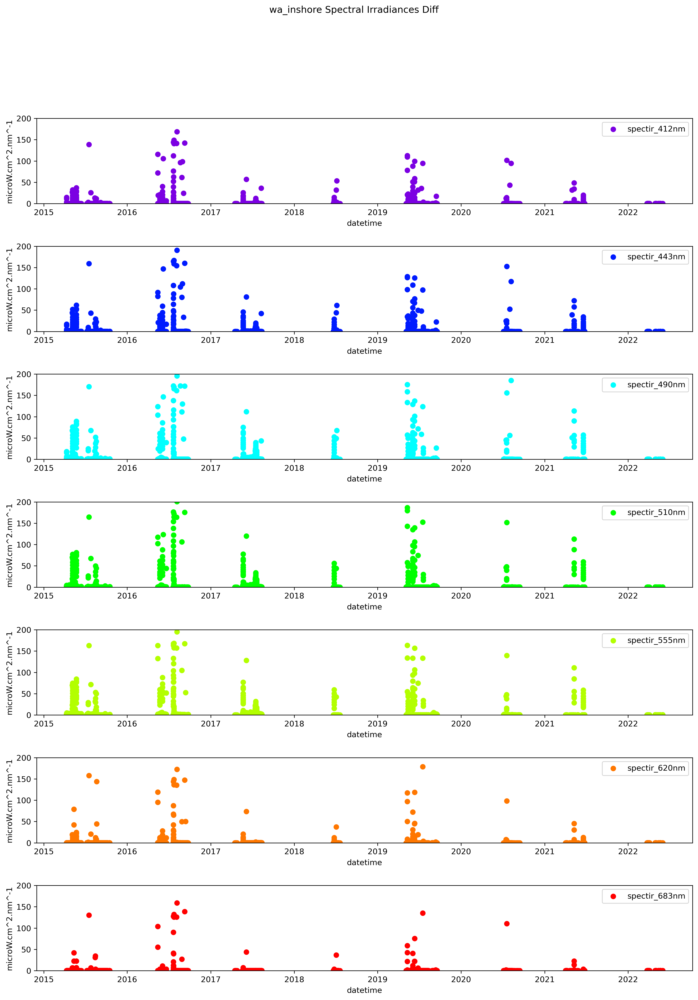

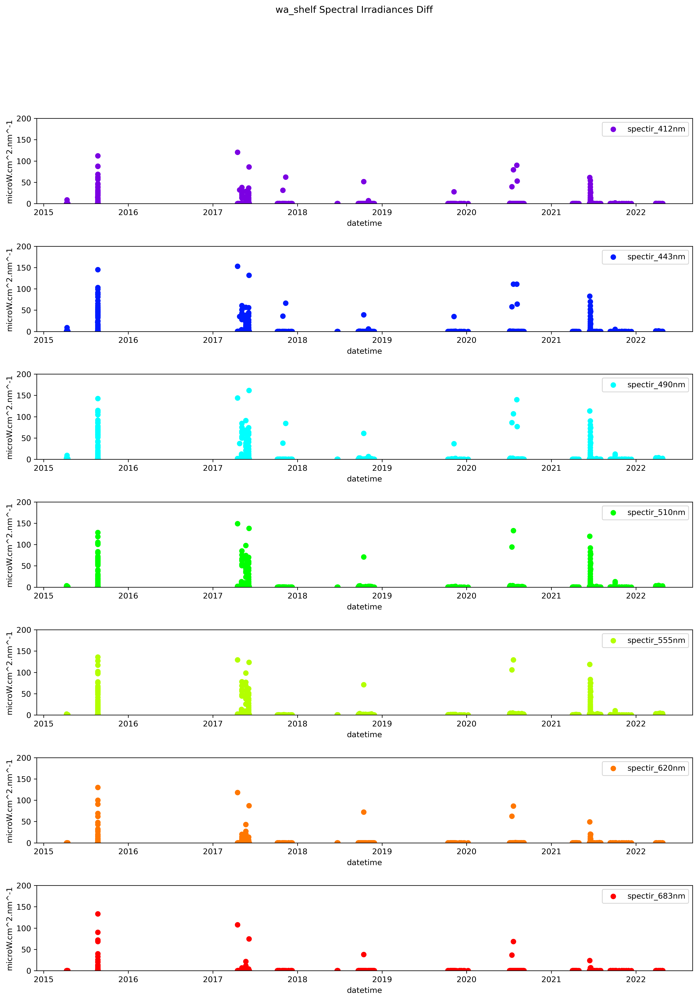

In [13]:
for site in range(4): #four sites
    fig, axs = plt.subplots(7,1, figsize=(15, 20), facecolor='w', edgecolor='k', dpi=300)
    fig.subplots_adjust(hspace = .5, wspace=.001)
    fig.suptitle("{} Spectral Irradiances Diff".format(mooring_list[site]))
    axs = axs.ravel()
    for i in range(7):
        axs[i].scatter(diff_dfs[site]["time"], diff_dfs[site][wavelengthnm_list[i]], 
                 label = wavelengthnm_list[i], color = pal[i])
        axs[i].set_xlabel("datetime")
        axs[i].set_ylabel("microW.cm^2.nm^-1")
        axs[i].legend()
        axs[i].set_ylim([0, 200])